In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import sys
data_path = "../../../TabulaSapiensData/"
ts_path = "../"
sys.path.append(ts_path)


In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


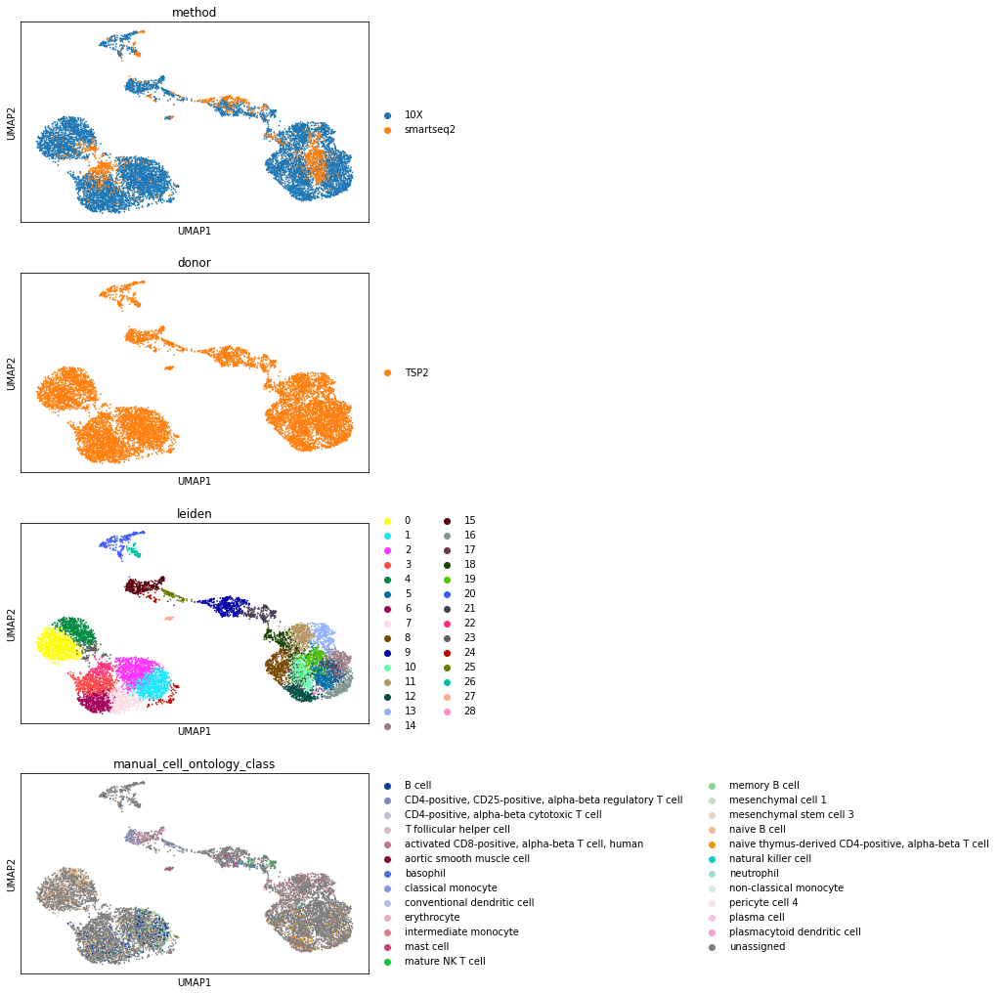

In [5]:
organ = "Lymph_Node"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

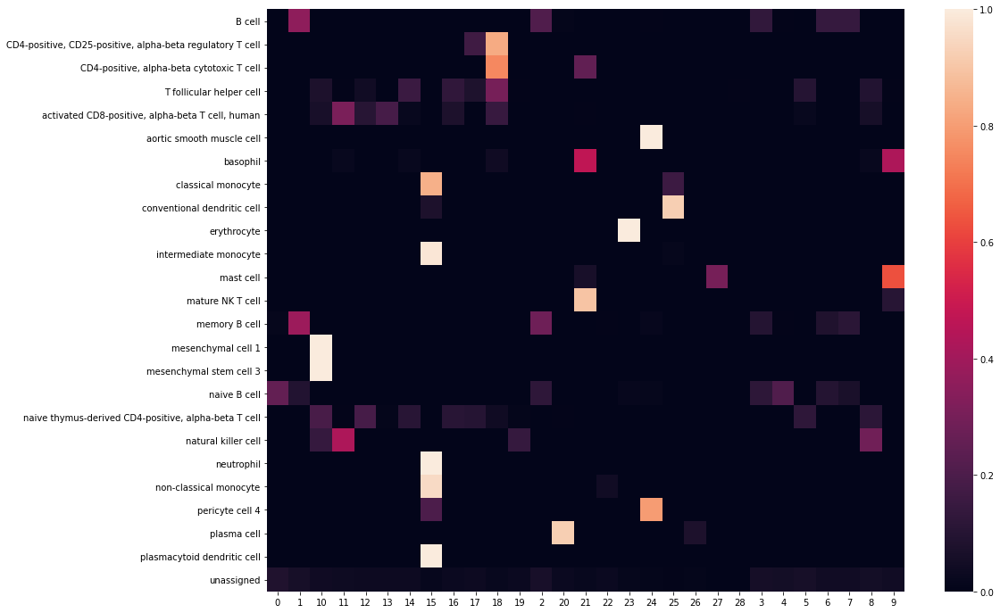

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.sum(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['memory B cell: 0.00', 'naive B cell: 0.21', 'unassigned: 0.79']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


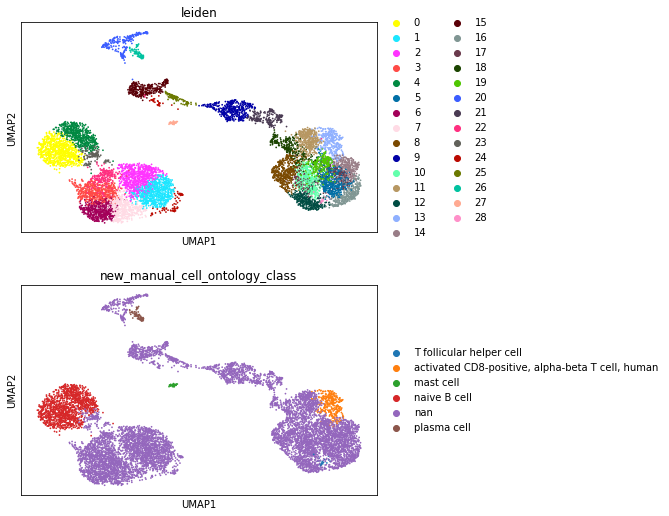

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [14]:
organ_adata.obs.groupby(["leiden"]).agg(
    {"new_manual_cell_ontology_class": set, "Propagated.Annotation": set}
)

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{naive B cell},"{naive B cell, B cell, memory B cell}"
1,{nan},"{naive B cell, B cell, memory B cell}"
2,{nan},"{conventional dendritic cell, naive B cell, B ..."
3,{nan},"{naive B cell, B cell, memory B cell}"
4,{naive B cell},"{naive B cell, B cell, memory B cell}"
5,{nan},"{activated CD8-positive, alpha-beta T cell, hu..."
6,{nan},"{naive B cell, B cell, memory B cell}"
7,{nan},"{naive B cell, B cell, memory B cell}"
8,{nan},"{natural killer cell, activated CD8-positive, ..."


/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


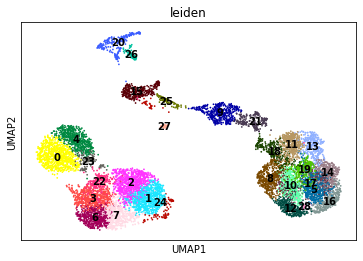

In [15]:
sc.pl.umap(organ_adata, color="leiden", legend_loc="on data")

# Sankey Diagram between cluster and compartment

In [16]:
from utils.colorDict import (
    donor_colors,
    method_colors,
    compartment_colors,
    tissue_colors,
)

In [17]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [18]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Lymph_Node.html'

# visualize compartment markers

In [19]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [20]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



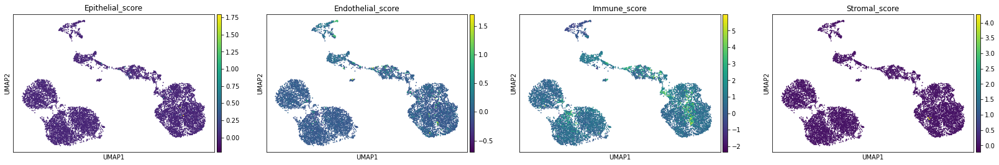

In [21]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [22]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [23]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [24]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [25]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]


,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,IGHD,HLA-DRA,TNFRSF13C,CD83,IGHD,RPS29,CD83,RPS29,IL7R,AREG,...,EEF1A1P5,MZB1,KLRD1,CD74,IGHM,GPX1,CST3,MZB1,TPSB2,IL32
1,IGHM,HLA-DPB1,BANK1,BANK1,AL139020.1,IL7R,HSPA1A,RPL39,CD3E,NFKBIA,...,RPS3AP26,IGKC,NKG7,HLA-DRA,MS4A1,FABP5,LYZ,SSR4,TPSAB1,GIMAP7
2,AL139020.1,HLA-DPA1,MS4A1,MS4A1,IGHM,RPL37,JUND,HLA-DRA,CD3D,IL7R,...,MALAT1,DERL3,GNLY,HLA-DRB1,IGHD,YBX1,HLA-DPB1,PRDX4,CPA3,CD3D
3,YBX3,MS4A1,BLK,IRF8,YBX3,RPS27,HSPA1B,MT-ND3,IL6ST,TNFAIP3,...,TSC22D3,HDLBP,KLRF1,IRF8,FCRL1,HLA-DPB1,HLA-DPA1,DERL3,IL1RL1,LEPROTL1
4,CD83,HLA-DQA1,CD79B,TNFRSF13C,LINC00926,RPS26,MT-ND3,HLA-DPA1,CD2,ID2,...,RPL13AP5,RRBP1,CMC1,TMSB4XP8,AL139020.1,PRDX1,GSTP1,SEC11C,KIT,LDHB
5,LINC00926,CD79A,CD79A,MT-ND3,CD79B,RPL39,KLF2,RPL37,CD3G,FOS,...,FP671120.5,HSP90B1,KLRC1,MS4A1,CD74,TMSB4X,GPX1,FKBP11,LAPTM4A,PASK
6,LINC02397,NAPSB,RALGPS2,JUND,CD79A,TRAC,RHOB,RPS21,BCL11B,ZFP36,...,SARAF,XBP1,CTSW,MT-ATP8,IRF8,FKBP1A,C1orf162,IGKC,CD63,LEF1
7,FCRL1,BLK,MARCH1,RALGPS2,STAG3,RPL34,IER5,HLA-DPB1,FYB1,ZFP36L2,...,DNAJB1,JCHAIN,PRF1,EEF1A1P5,HLA-DRA,COTL1,SPI1,XBP1,CD9,TRBC1
8,CD79A,SMIM14,HLA-DRA,LY9,RNASE6,RPL41,IRF8,HLA-DQA1,TRAC,RUNX2,...,TMSB4XP8,SDF2L1,FCER1G,MALAT1,HLA-DRB1,HLA-DPA1,GRN,CD63,RHEX,CD3G
9,FCER2,MARCKS,ARHGAP24,KLF2,IL4R,DNAJB1,TNFRSF13C,RPS28,GIMAP7,FKBP5,...,B2M,PRDX4,TYROBP,MT-CO3,CD22,GAPDH,HLA-DRA,JCHAIN,CLU,TRAC


In [26]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
IGHD,41.346729,4.341938,0.000000e+00
IGHM,40.573132,4.304816,0.000000e+00
AL139020.1,40.069462,4.548138,0.000000e+00
YBX3,38.471691,3.843168,0.000000e+00
CD83,29.800184,2.418587,3.812110e-191
LINC00926,29.385778,2.386677,7.018695e-186
LINC02397,28.433821,2.454918,5.684771e-174
FCRL1,27.436211,2.385076,6.638201e-162
CD79A,26.533785,2.087517,2.326516e-151
FCER2,23.690800,2.900488,1.553400e-120


1


,wilcoxon_score,log fold change,adjusted pvalue
HLA-DRA,27.595001,2.702334,7.520972e-163
HLA-DPB1,26.762915,2.102244,2.571447e-153
HLA-DPA1,26.528568,2.063832,6.680695e-151
MS4A1,26.060001,1.990607,1.220181e-145
HLA-DQA1,25.386345,1.996819,3.501727e-138
CD79A,24.968441,2.014461,1.132536e-133
NAPSB,24.690603,1.966320,9.929241e-131
BLK,24.171658,1.825307,2.891632e-125
SMIM14,24.104034,1.977764,1.334990e-124
MARCKS,23.495617,2.031157,2.218412e-118


2


,wilcoxon_score,log fold change,adjusted pvalue
TNFRSF13C,25.850548,1.909022,1.272525e-142
BANK1,25.827787,1.909750,1.272525e-142
MS4A1,25.165707,2.014659,1.866763e-135
BLK,23.911154,1.890071,3.451019e-122
CD79B,23.002628,1.460473,4.304604e-113
CD79A,22.985786,1.917514,5.438721e-113
RALGPS2,22.183670,1.787764,3.633901e-105
MARCH1,20.677244,1.614359,3.268669e-91
HLA-DRA,20.593948,2.269679,1.664257e-90
ARHGAP24,20.042261,1.608106,1.156858e-85


3


,wilcoxon_score,log fold change,adjusted pvalue
CD83,27.900026,3.095841,1.569552e-166
BANK1,26.484747,2.521969,4.275949e-150
MS4A1,26.103230,2.635377,6.574984e-146
IRF8,25.573915,2.334763,4.380815e-140
TNFRSF13C,24.172268,2.047090,5.128597e-125
MT-ND3,23.615305,1.231107,2.633121e-119
JUND,23.398870,1.194321,3.690549e-117
RALGPS2,22.881865,2.216765,5.182527e-112
LY9,22.621378,2.020005,1.746547e-109
KLF2,22.334620,1.776781,1.003002e-106


4


,wilcoxon_score,log fold change,adjusted pvalue
IGHD,32.287876,3.822213,6.093222e-224
AL139020.1,32.176128,4.049213,1.121051e-222
IGHM,30.986561,3.730184,1.605077e-206
YBX3,27.528267,3.003101,9.487268e-163
LINC00926,22.092300,2.028145,1.697303e-104
CD79B,21.695679,1.501509,9.476857e-101
CD79A,21.068144,1.924228,5.399563e-95
STAG3,18.868704,2.076803,4.048297e-76
RNASE6,18.128853,1.497776,2.847744e-70
IL4R,16.862846,2.147617,9.036316e-61


5


,wilcoxon_score,log fold change,adjusted pvalue
RPS29,28.737663,1.727476,7.604927e-177
IL7R,28.390575,4.986626,7.780831e-173
RPL37,26.782724,1.612015,1.007914e-153
RPS27,25.863108,2.586329,2.550273e-143
RPS26,25.641720,1.833447,6.157748e-141
RPL39,25.357073,1.565806,7.367679e-138
TRAC,25.177465,4.335638,5.948089e-136
RPL34,24.761757,1.869846,1.704487e-131
RPL41,24.580122,1.598187,1.348217e-129
DNAJB1,24.405624,4.062002,8.774733e-128


6


,wilcoxon_score,log fold change,adjusted pvalue
CD83,23.518381,2.365681,1.557461e-117
HSPA1A,23.058210,3.101465,3.581736e-113
JUND,22.857954,1.179039,2.390243e-111
HSPA1B,22.476414,2.842182,1.039315e-107
MT-ND3,22.357195,1.265478,1.210030e-106
KLF2,22.114201,1.761608,2.264183e-104
RHOB,19.997862,1.817476,4.834483e-85
IER5,19.737612,1.969543,7.543508e-83
IRF8,19.426407,1.455194,3.019093e-80
TNFRSF13C,19.124334,1.594555,9.323995e-78


7


,wilcoxon_score,log fold change,adjusted pvalue
RPS29,23.824577,1.235063,1.093928e-120
RPL39,22.946424,1.128751,4.708837e-112
HLA-DRA,21.912678,2.821532,3.774413e-102
MT-ND3,21.900587,1.263493,3.774413e-102
HLA-DPA1,21.653351,2.206461,6.654345e-100
RPL37,21.573782,0.995766,3.107420e-99
RPS21,21.282806,1.063988,1.377878e-96
HLA-DPB1,21.253273,2.109844,2.262530e-96
HLA-DQA1,21.014378,2.074100,3.169566e-94
RPS28,20.943462,0.988615,1.267106e-93


8


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,21.727667,2.751849,2.205048e-100
CD3E,20.908333,1.995305,6.617939e-93
CD3D,20.205549,1.738907,1.030117e-86
IL6ST,19.045374,1.925376,3.841121e-77
CD2,18.061058,1.539101,3.167883e-69
CD3G,17.811569,1.330483,2.114760e-67
BCL11B,17.756779,1.758108,5.289803e-67
FYB1,17.202042,1.432210,7.185961e-63
TRAC,17.085503,1.216266,4.870822e-62
GIMAP7,16.687099,1.322397,3.990587e-59


9


,wilcoxon_score,log fold change,adjusted pvalue
AREG,28.317080,5.298887,1.253727e-171
NFKBIA,24.742384,4.653574,1.102189e-130
IL7R,24.315517,4.726819,2.636385e-126
TNFAIP3,23.600674,4.258852,4.466112e-119
ID2,23.185480,4.502397,6.260116e-115
FOS,22.136961,3.565109,1.171655e-104
ZFP36,21.457054,3.578750,2.887464e-98
ZFP36L2,21.285461,2.159894,1.012657e-96
RUNX2,20.000065,4.925075,2.943572e-85
FKBP5,19.187611,2.304183,1.975292e-78


10


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,21.952547,3.057145,4.820387e-102
S100A4,20.820415,1.956230,8.321873e-92
IL32,20.387157,2.077232,4.266515e-88
GIMAP7,20.313454,2.013171,1.439102e-87
TRAC,19.988035,1.866501,8.241567e-85
ARL4C,19.859982,2.101977,8.864332e-84
CD3D,19.780298,1.951862,3.701086e-83
CD3G,19.031967,1.698595,6.064019e-77
ANXA1,18.989059,1.909352,1.236618e-76
CD3E,18.808258,1.974972,3.458764e-75


11


,wilcoxon_score,log fold change,adjusted pvalue
CCL5,29.212910,5.132019,7.826809e-183
GZMK,28.416256,4.896248,3.748481e-173
GZMA,27.905745,4.623610,4.459270e-167
CCL4,25.369215,4.281975,8.118213e-138
CST7,25.317446,3.597432,2.416770e-137
CCL3L1,23.421553,4.317594,2.529369e-117
NKG7,22.482115,3.559519,4.062578e-108
HCST,21.865767,2.140115,2.945293e-102
IL32,21.253950,2.288016,1.274405e-96
CD3D,20.761639,2.176491,3.332350e-92


12


,wilcoxon_score,log fold change,adjusted pvalue
PRKCQ-AS1,20.785105,2.495207,3.475442e-91
NOSIP,19.876513,2.160079,1.913183e-83
BCL11B,19.279892,2.385107,1.554985e-78
CD3E,19.257450,2.155222,1.799268e-78
LDHB,18.660305,1.329868,1.021754e-73
CD3D,18.546143,1.913331,7.368668e-73
GYPC,17.932619,1.655485,4.828481e-68
CD3G,17.430475,1.665913,3.168614e-64
NDFIP1,17.379131,1.758279,6.990094e-64
LEPROTL1,17.266731,1.513775,4.482370e-63


13


,wilcoxon_score,log fold change,adjusted pvalue
CCL5,25.652292,5.360915,2.346694e-140
GZMA,23.657114,4.396618,2.935322e-119
GZMK,22.511845,4.268710,6.235628e-108
CST7,21.540508,3.970763,9.564695e-99
CCL4,19.973915,4.608777,1.093569e-84
CCL3L1,18.783590,4.246046,1.009464e-74
DNAJB1,18.124836,2.545158,1.194746e-69
DUSP2,17.784542,2.342747,4.217014e-67
IL32,17.547716,2.254205,2.430201e-65
HCST,17.529016,2.025203,3.165903e-65


14


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,20.116499,3.203558,2.622160e-85
BCL11B,20.090652,2.574984,2.622160e-85
DNAJB1,18.007687,2.142828,3.327453e-68
ANXA1,17.206223,2.648947,3.509963e-62
HSPA1B,17.085510,2.705982,2.240276e-61
AAK1,16.895685,1.915065,4.749371e-60
IL6ST,16.332581,2.161796,4.259550e-56
ETS1,15.743305,1.523376,4.494661e-52
CD3E,15.705632,1.757036,7.406420e-52
FYB1,15.671137,1.735503,1.079030e-51


15


,wilcoxon_score,log fold change,adjusted pvalue
S100A9,28.822378,10.897655,6.621777e-178
LYZ,28.769650,9.148210,1.514129e-177
TYROBP,28.471767,6.736648,5.142598e-174
AIF1,28.380831,7.278482,5.131872e-173
CST3,28.351454,7.839244,9.456671e-173
CD163,28.257339,9.131670,1.134709e-171
CEBPD,28.143877,6.592465,2.394913e-170
MS4A6A,27.841078,7.544390,1.016499e-166
FGL2,27.670141,6.479909,1.004093e-164
LST1,27.667780,5.947183,1.004093e-164


16


,wilcoxon_score,log fold change,adjusted pvalue
RPS29,22.313053,1.446780,1.624814e-105
RPL37,22.166830,1.269747,2.113156e-104
BCL11B,22.027784,2.895991,3.061685e-103
RPS21,21.215837,1.300490,1.003755e-95
RPS28,21.047956,1.200554,2.811087e-94
NOSIP,20.980629,2.296013,9.672296e-94
RPS26,20.654701,1.134398,7.448468e-91
RPL38,20.380478,1.278440,1.833903e-88
RPL39,20.139778,1.205447,2.163914e-86
PRKCQ-AS1,19.647581,2.420739,3.569609e-82


17


,wilcoxon_score,log fold change,adjusted pvalue
IL6ST,17.563219,2.293653,1.387156e-64
CTLA4,17.280258,3.206069,1.300069e-62
RTKN2,16.249201,4.353067,3.330489e-55
BCL11B,14.991470,1.883400,5.460827e-47
AAK1,14.806949,1.753810,7.776857e-46
TIGIT,14.754434,2.851902,1.541860e-45
ETS1,14.591825,1.406714,1.553243e-44
IL32,14.049233,1.442474,2.865215e-41
CD3E,13.995158,1.612750,5.778195e-41
TRAC,13.987369,1.241270,6.088951e-41


18


,wilcoxon_score,log fold change,adjusted pvalue
IL32,25.334005,4.860050,7.939299e-137
CD3D,23.479517,4.147358,1.944092e-117
CD2,23.270582,4.015021,1.727954e-115
CTLA4,23.133549,5.533987,3.133034e-114
TRAC,22.624807,3.973799,2.642427e-109
CD3E,22.620998,3.470021,2.642427e-109
S100A4,22.115887,3.858557,1.869491e-104
CD3G,21.736279,3.672889,6.854751e-101
LCK,21.526791,3.594086,5.715520e-99
GMFG,21.081511,2.894323,6.921515e-95


19


,wilcoxon_score,log fold change,adjusted pvalue
EEF1A1P5,20.678444,5.633756,3.188353e-90
RPS3AP26,20.596672,4.765860,8.652791e-90
MALAT1,20.534845,3.787326,2.063387e-89
TSC22D3,20.425753,6.149920,1.452981e-88
RPL13AP5,20.378942,5.330467,3.027679e-88
FP671120.5,20.316195,5.106907,9.073025e-88
SARAF,20.168798,6.080228,1.383466e-86
DNAJB1,20.167749,6.957599,1.383466e-86
TMSB4XP8,20.109859,6.207488,3.957037e-86
B2M,20.013012,4.308918,2.497413e-85


20


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,25.215227,10.713435,1.605455e-135
IGKC,23.865107,11.741367,1.384911e-121
DERL3,23.849995,7.459135,1.490539e-121
HDLBP,23.596455,5.694899,4.934500e-119
RRBP1,23.494371,6.290451,4.568926e-118
HSP90B1,23.425104,5.873428,1.813387e-117
XBP1,23.423473,6.724636,1.813387e-117
JCHAIN,23.256273,11.160600,7.235961e-116
SDF2L1,23.199551,6.261725,2.462426e-115
PRDX4,23.179232,6.826100,3.618930e-115


21


,wilcoxon_score,log fold change,adjusted pvalue
KLRD1,25.038872,7.655791,1.358744e-133
NKG7,23.576897,6.137712,1.958309e-118
GNLY,22.194799,8.058305,7.566199e-105
KLRF1,21.977394,8.781541,6.974576e-103
CMC1,21.341215,4.696896,5.540360e-97
KLRC1,21.169146,7.172966,1.803965e-95
CTSW,21.082333,4.426777,9.717453e-95
PRF1,20.959705,5.189116,1.126107e-93
FCER1G,20.705626,4.812158,2.015996e-91
TYROBP,19.961100,4.053142,7.066977e-85


22


,wilcoxon_score,log fold change,adjusted pvalue
CD74,22.823954,8.933132,1.561274e-110
HLA-DRA,22.552025,6.575785,3.775882e-108
HLA-DRB1,22.387945,6.153625,1.012212e-106
IRF8,22.005106,7.623354,3.787107e-103
TMSB4XP8,21.343540,6.935009,5.271592e-97
MS4A1,21.228577,7.353697,5.103438e-96
MT-ATP8,20.928961,5.564741,2.453980e-93
EEF1A1P5,20.838549,5.564099,1.424790e-92
MALAT1,20.826420,4.038342,1.631519e-92
MT-CO3,20.807602,4.606194,2.174417e-92


23


,wilcoxon_score,log fold change,adjusted pvalue
IGHM,14.767632,6.463382,1.394595e-44
MS4A1,13.766330,5.529913,1.196052e-38
IGHD,13.659567,5.477797,3.473991e-38
FCRL1,12.838212,4.990150,1.179298e-33
AL139020.1,12.590343,7.480112,2.341424e-32
CD74,12.507237,6.052025,5.731684e-32
IRF8,12.384282,5.335399,2.339483e-31
HLA-DRA,11.600771,4.139352,2.671276e-27
HLA-DRB1,10.736114,3.844231,3.686519e-23
CD22,10.044301,4.268278,3.832953e-20


24


,wilcoxon_score,log fold change,adjusted pvalue
GPX1,6.152436,1.686104,3.293499e-07
FABP5,5.401695,2.285211,2.056212e-05
YBX1,5.333621,1.151948,2.876959e-05
HLA-DPB1,5.302218,1.166571,3.401489e-05
PRDX1,5.069352,1.660818,1.063315e-04
TMSB4X,4.654853,0.819568,6.890373e-04
FKBP1A,4.415525,1.441791,1.853474e-03
COTL1,4.415026,1.215755,1.853474e-03
HLA-DPA1,4.414884,1.012820,1.853474e-03
GAPDH,4.400233,1.038479,1.976985e-03


25


,wilcoxon_score,log fold change,adjusted pvalue
CST3,15.970507,9.505148,1.207509e-52
LYZ,15.799026,9.952068,9.300305e-52
HLA-DPB1,15.768223,5.319910,1.010171e-51
HLA-DPA1,15.531410,5.599722,2.987056e-50
GSTP1,15.520089,5.653629,2.987056e-50
GPX1,15.475619,5.429498,4.326709e-50
C1orf162,15.474656,5.898319,4.326709e-50
SPI1,15.150850,5.429060,5.503807e-48
GRN,15.129025,5.752583,6.817731e-48
HLA-DRA,15.036052,5.601772,2.327882e-47


26


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,13.472090,9.441217,1.344062e-36
SSR4,13.349694,5.990448,2.333936e-36
PRDX4,12.750643,7.657519,3.033611e-33
DERL3,12.562119,7.766510,2.509865e-32
SEC11C,12.464624,6.146014,6.853546e-32
FKBP11,12.197042,6.226261,1.355346e-30
IGKC,11.784680,10.782461,1.531244e-28
XBP1,11.237951,6.370001,6.794904e-26
CD63,9.576746,5.012438,1.091832e-18
JCHAIN,9.540428,9.071281,1.495344e-18


27


,wilcoxon_score,log fold change,adjusted pvalue
TPSB2,8.863842,18.124655,1.166599e-14
TPSAB1,8.863128,17.019762,1.166599e-14
CPA3,8.862569,15.393976,1.166599e-14
IL1RL1,8.861048,13.618430,1.166599e-14
KIT,8.804850,9.383883,1.396485e-14
LAPTM4A,8.795566,5.011308,1.396485e-14
CD63,8.763989,4.612113,1.584947e-14
CD9,8.727197,7.444327,1.921098e-14
RHEX,8.552361,12.898220,7.888286e-14
CLU,8.482253,8.204907,1.300284e-13


28


,wilcoxon_score,log fold change,adjusted pvalue
IL32,3.499127,1.491946,0.308200
GIMAP7,3.280796,1.368795,0.483642
CD3D,3.114331,1.446260,0.682979
LEPROTL1,3.114169,1.295989,0.682979
LDHB,2.686568,0.759490,1.000000
PASK,2.612517,1.415590,1.000000
LEF1,2.541565,1.148252,1.000000
TRBC1,2.529968,0.477549,1.000000
CD3G,2.504680,0.948184,1.000000
TRAC,2.461433,0.938153,1.000000


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



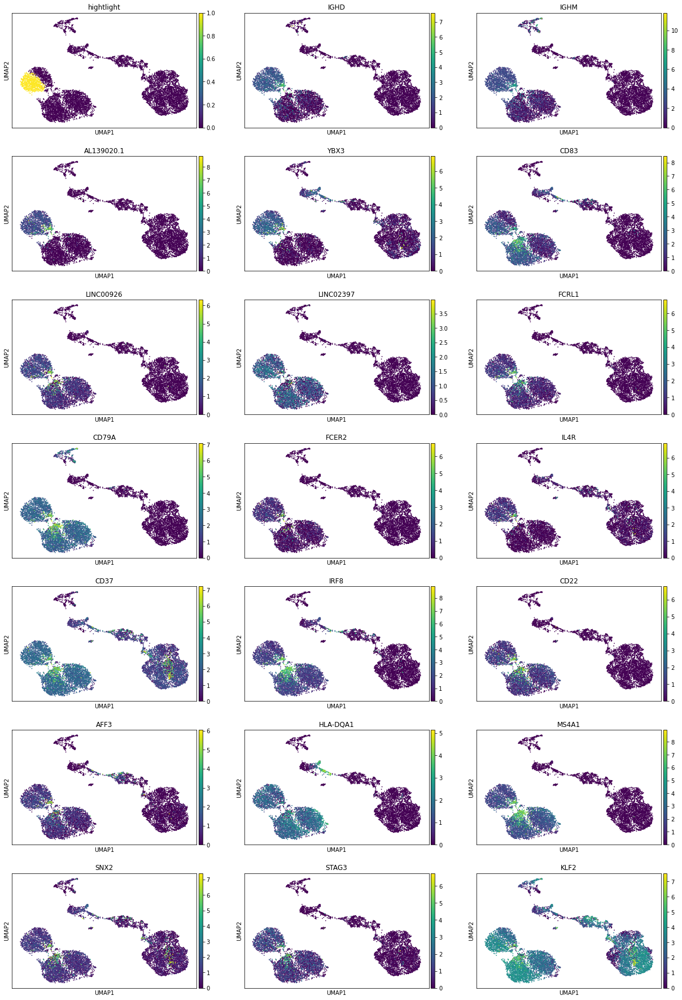

In [27]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


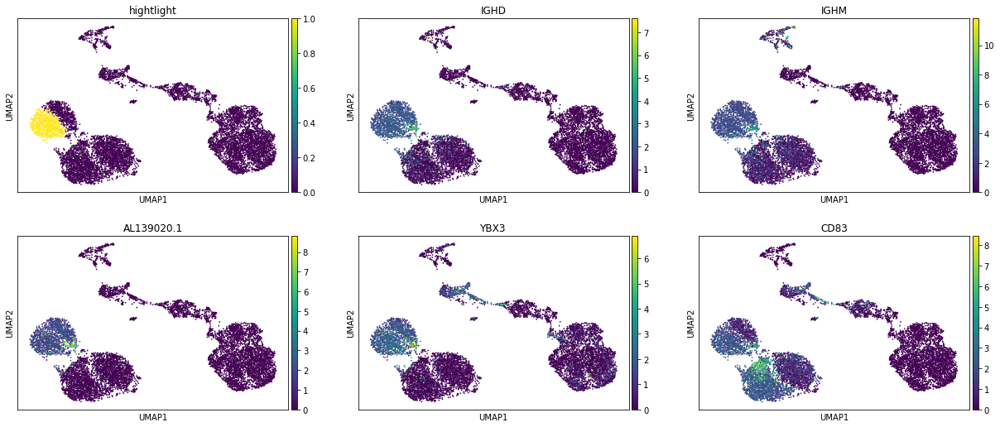

1


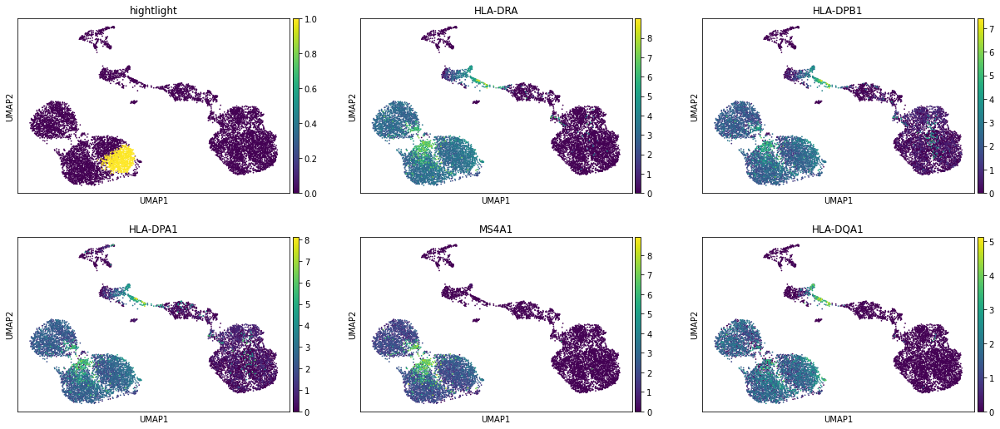

2


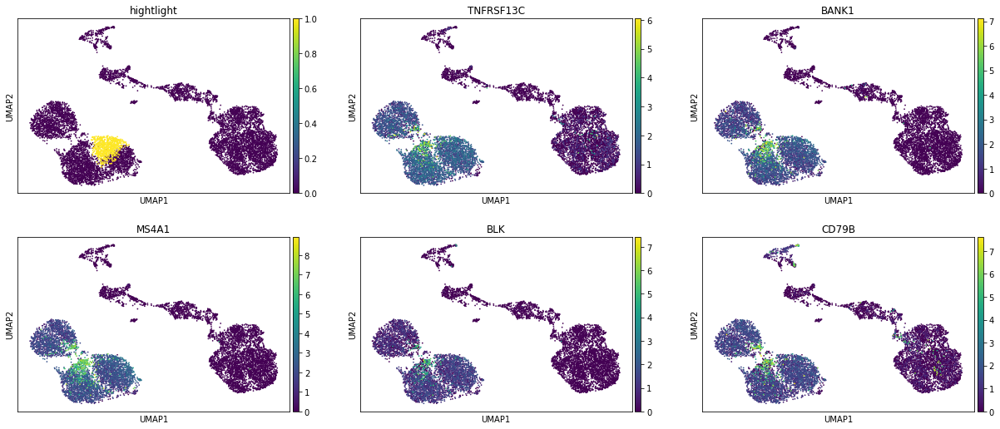

3


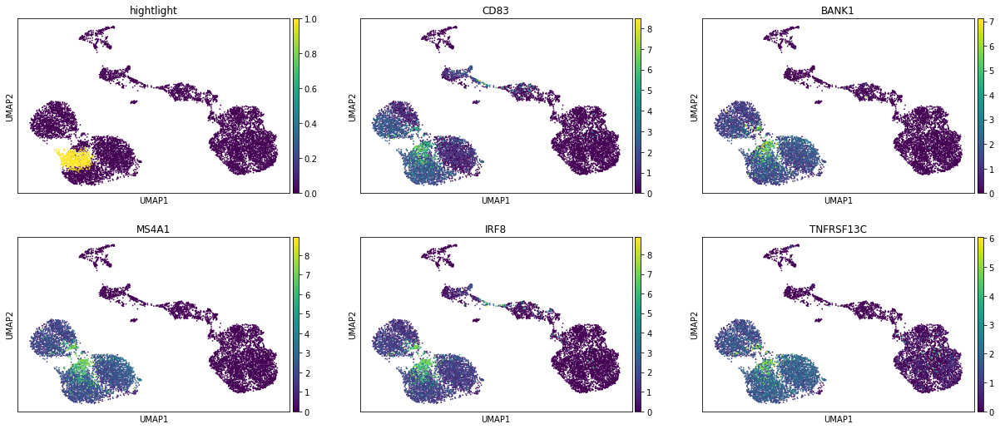

4


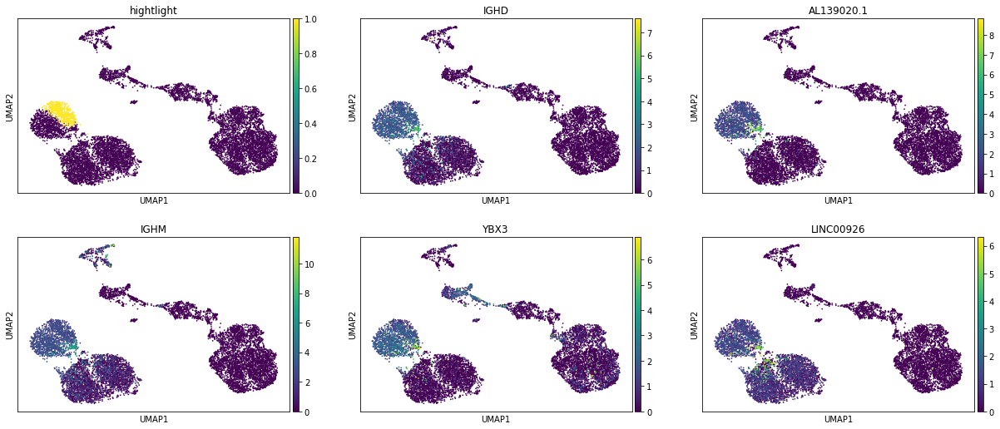

5


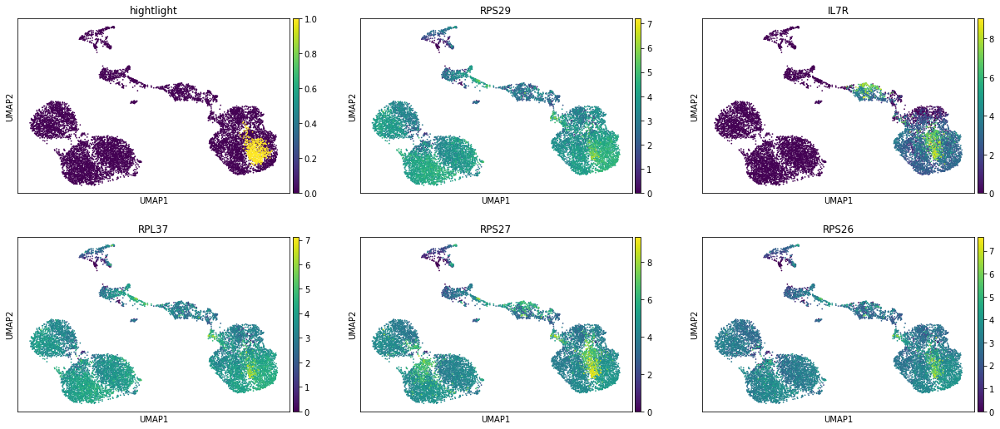

6


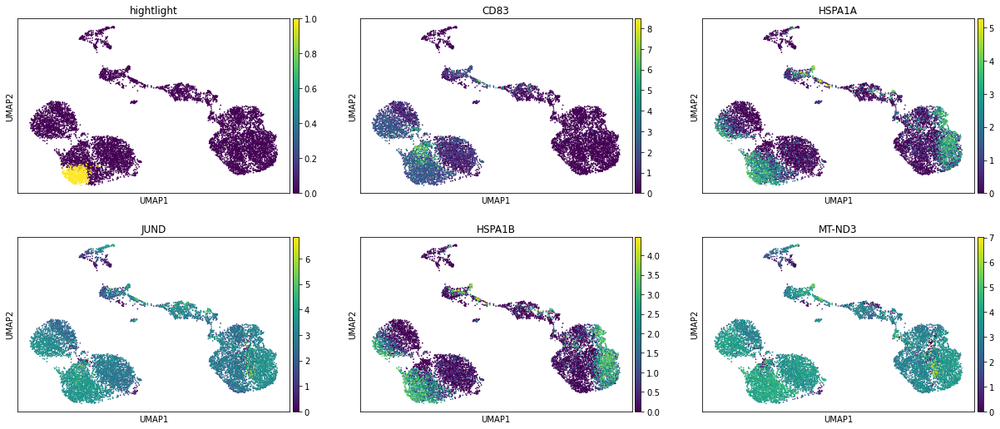

7


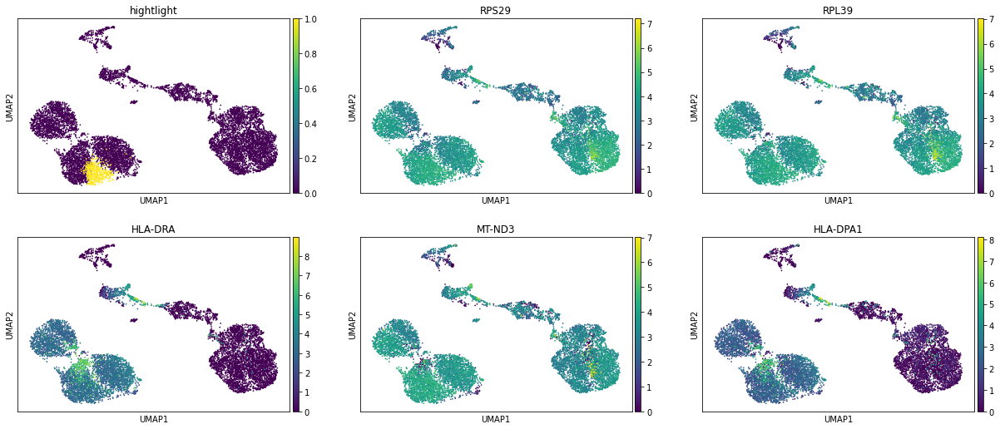

8


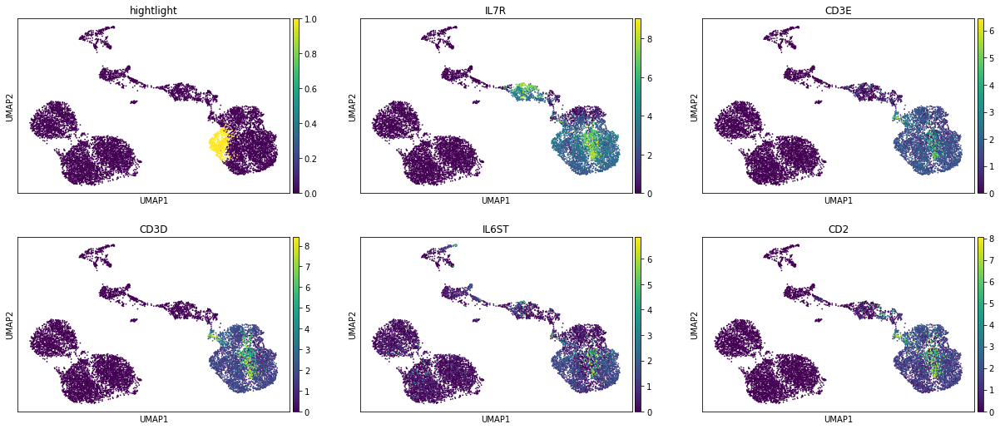

9


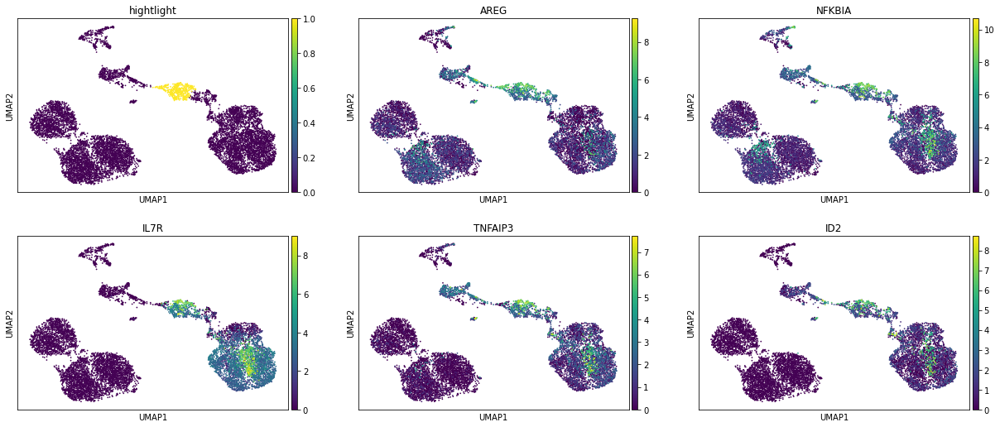

10


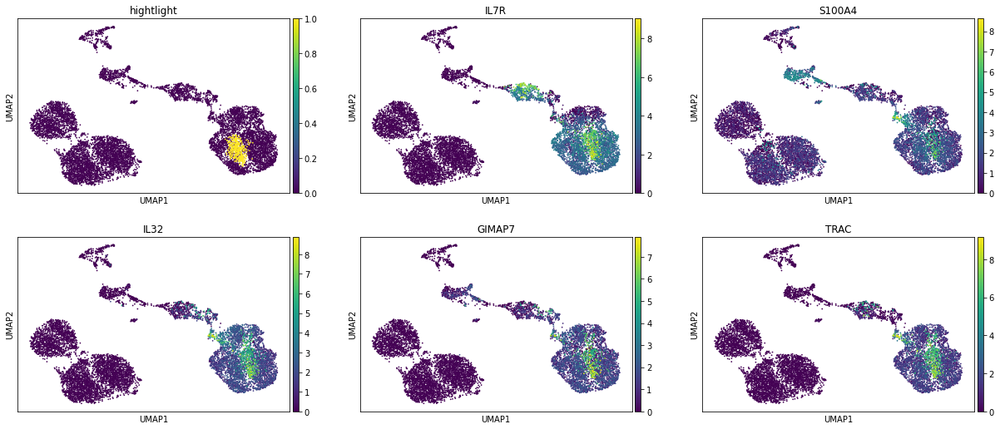

11


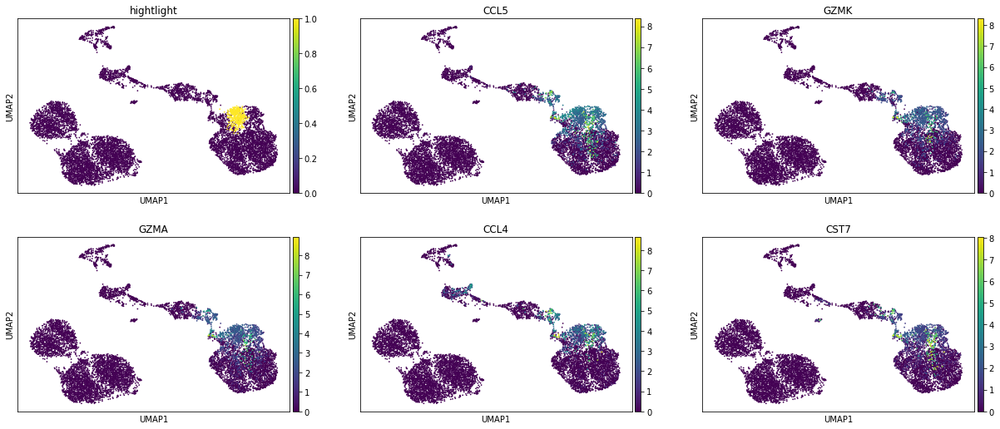

12


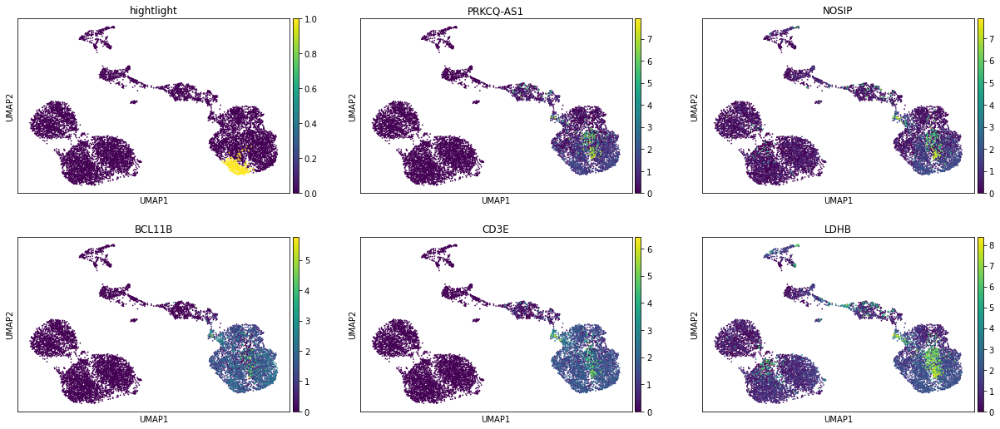

13


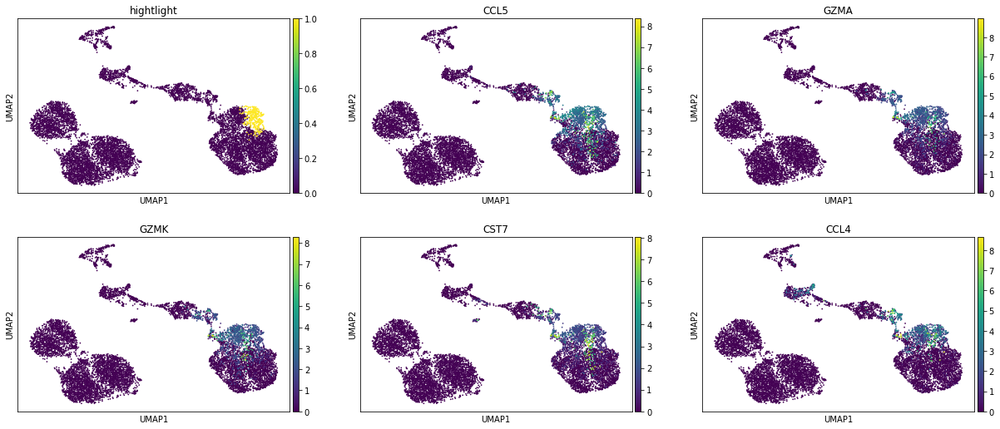

14


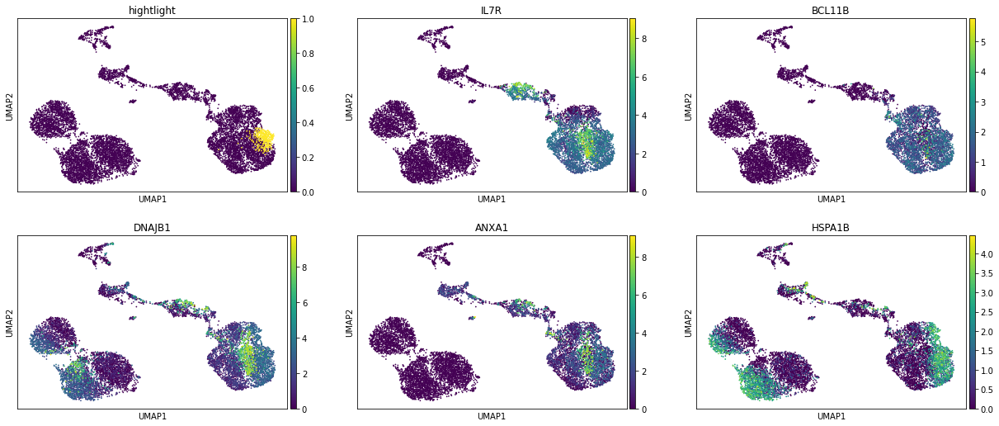

15


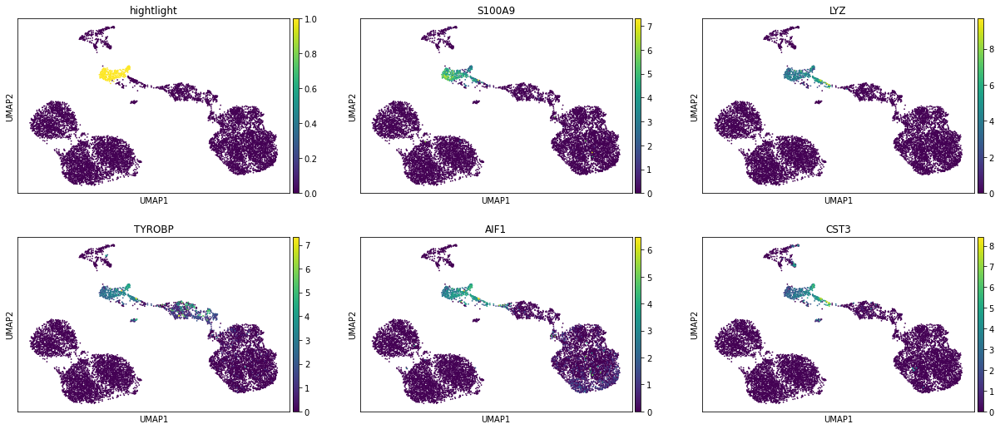

16


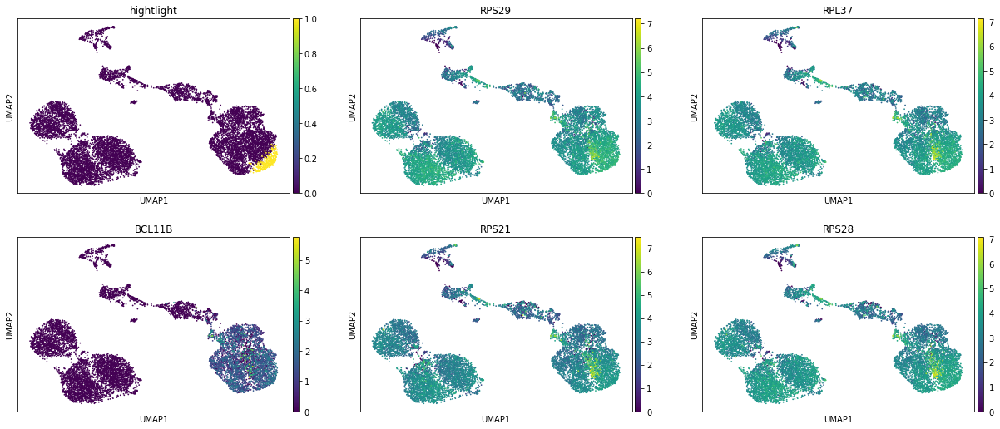

17


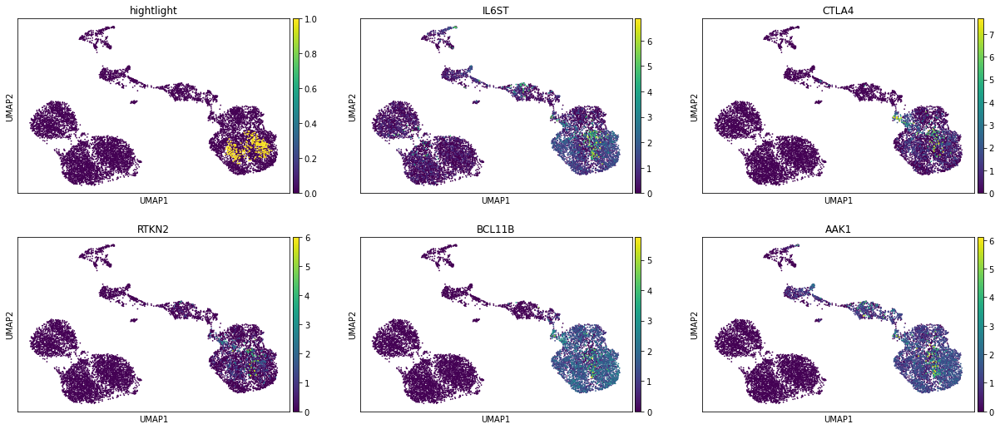

18


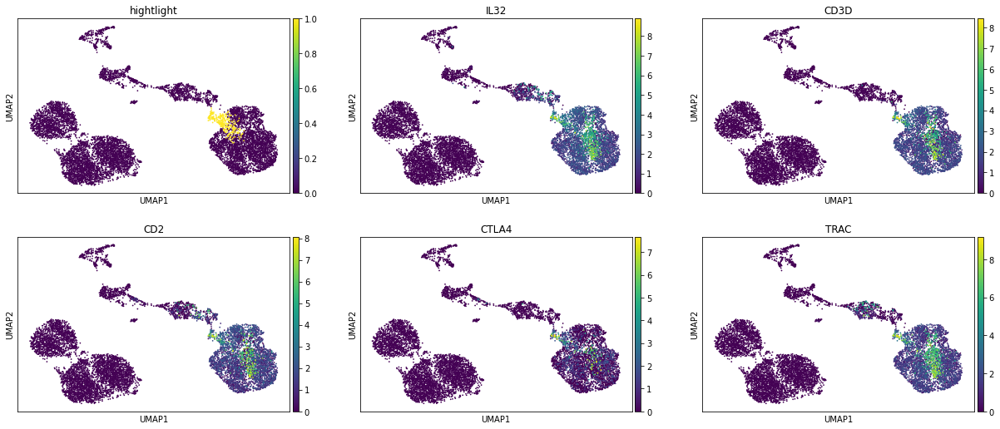

19


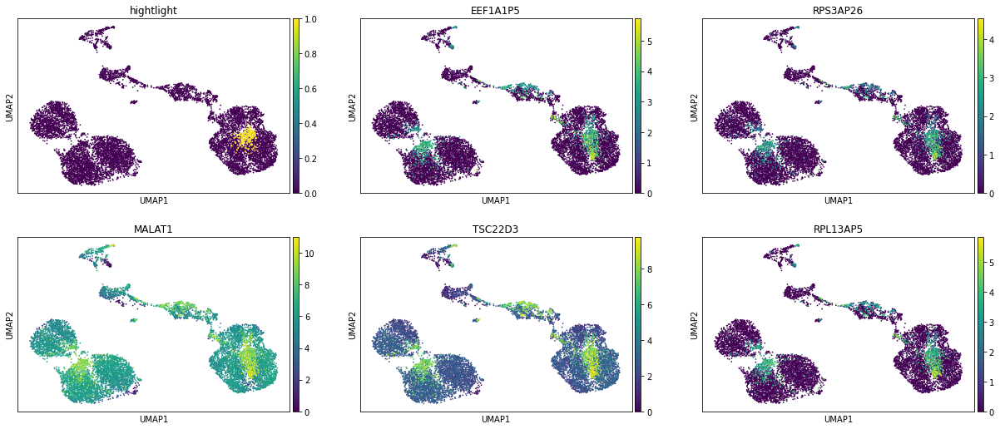

20


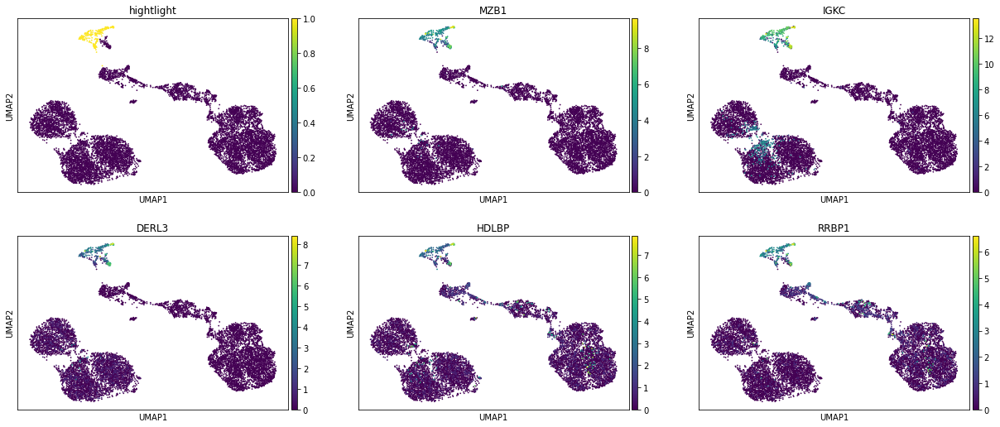

21


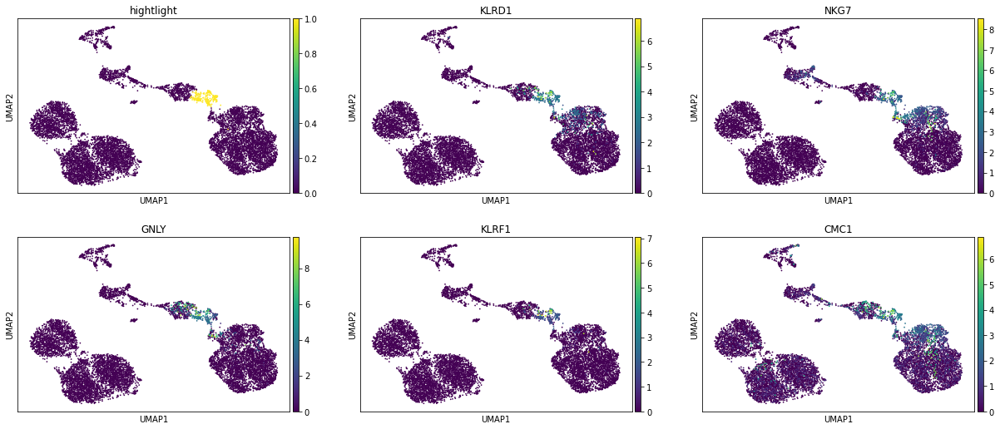

22


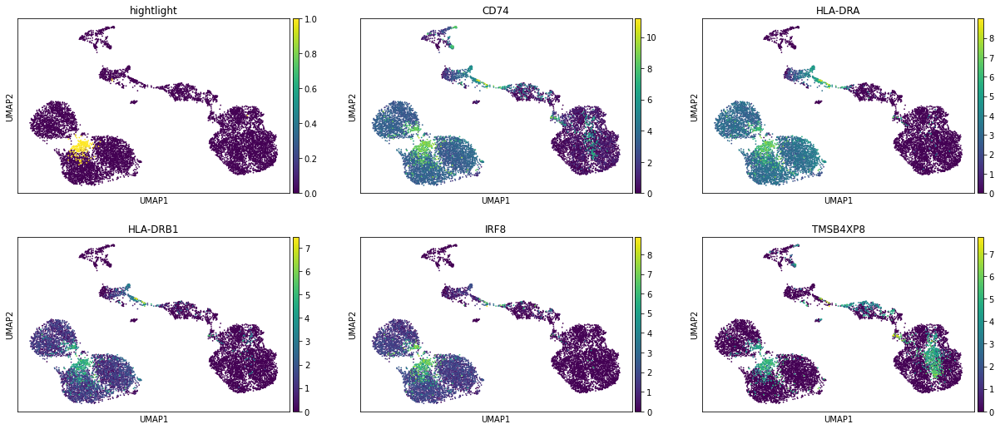

23


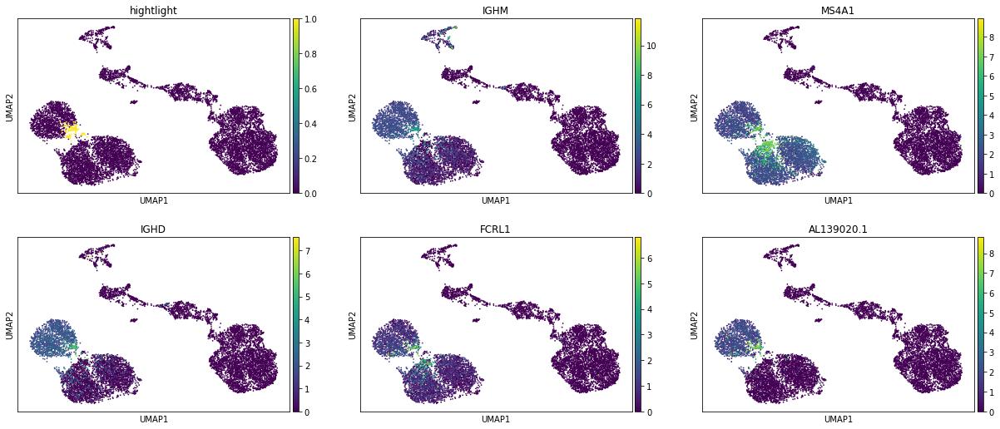

24


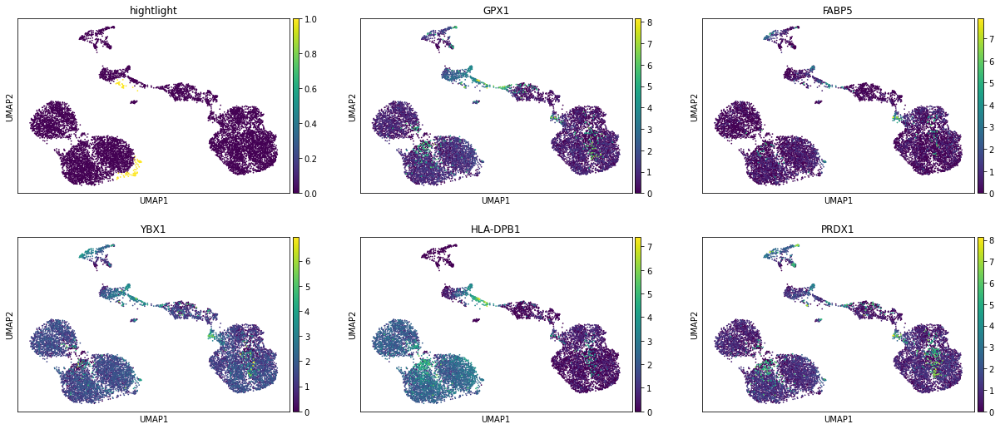

25


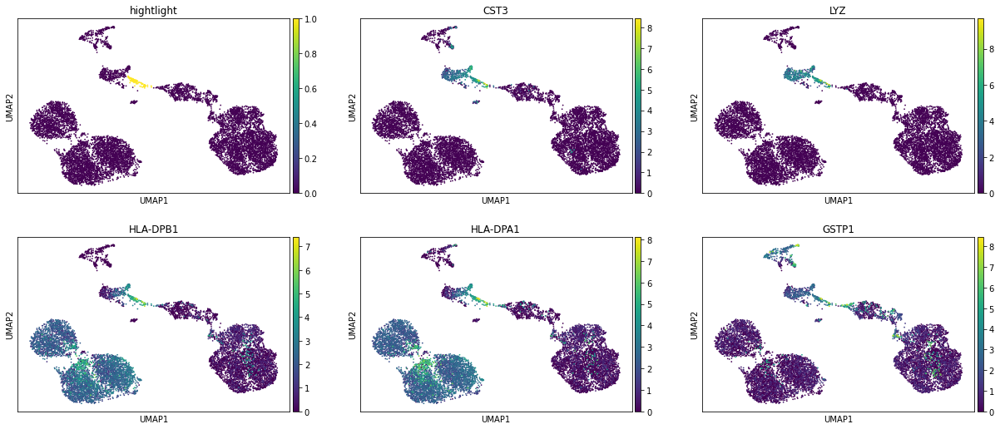

26


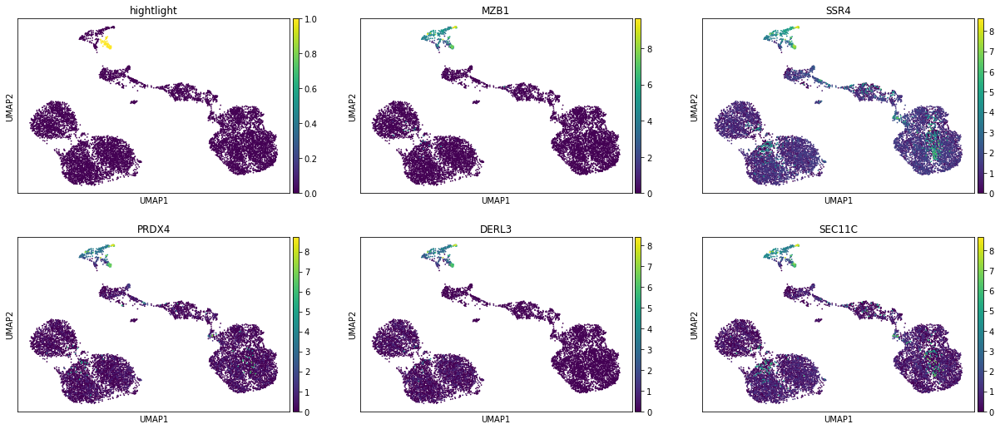

27


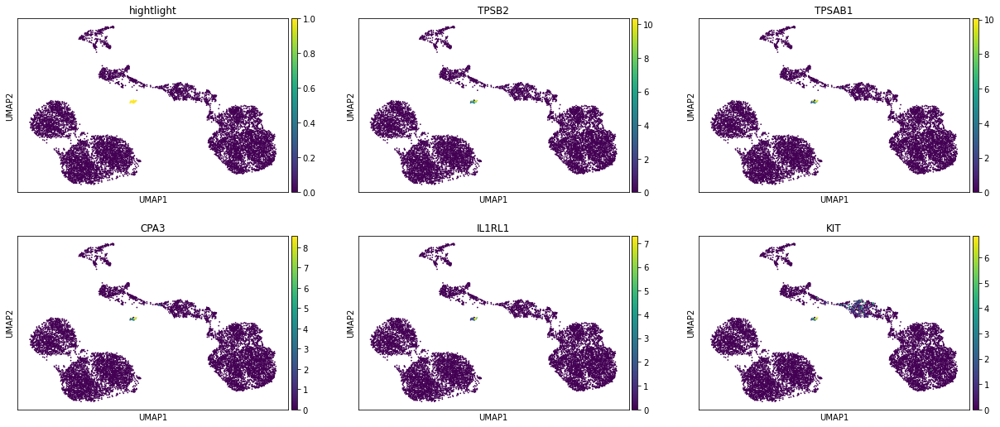

28


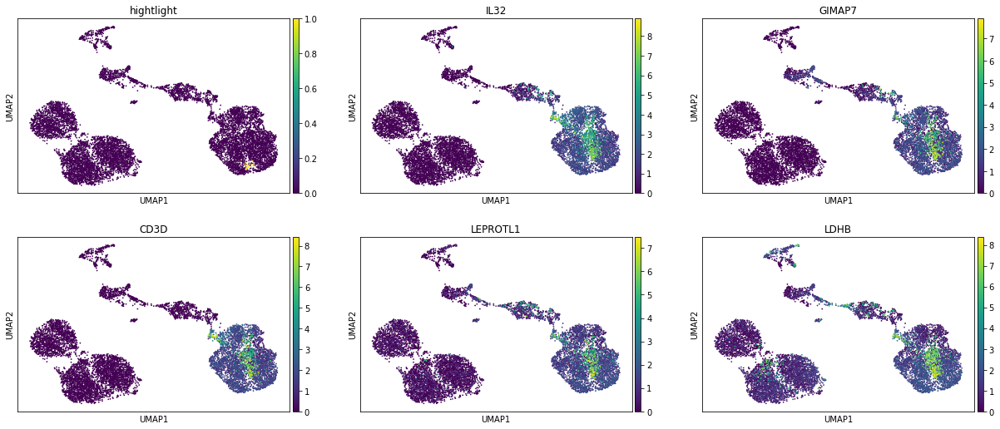

In [28]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [29]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
IGHD,41.346729,4.341938,0.000000e+00
IGHM,40.573132,4.304816,0.000000e+00
AL139020.1,40.069462,4.548138,0.000000e+00
YBX3,38.471691,3.843168,0.000000e+00
CD83,29.800184,2.418587,3.812110e-191
...,...,...,...
VIM,-24.602564,-2.212420,4.986433e-130
GAPDH,-24.763996,-2.239295,9.922565e-132
HLA-A,-25.794180,-1.300260,5.055846e-143
HLA-C,-25.922417,-1.330262,1.992173e-144


# read in cell ontology 

In [30]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [31]:
celltype_dict["T cell"]

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [32]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-positive, alpha-beta memory T cell',
 'CD4-positive, CD25-positive, alpha-beta regulatory T cell',
 'activated CD4-positive, alpha-beta T cell',
 'CD4-positive, CD8-intermediate double-positive thymocyte',
 'CD4-negative, CD8-negative type I NK T cell',
 'CD24-positive, CD4 single-positive thymocyte',
 'CD4-negative CD8-negative gamma-delta intraepithelial T cell',
 'CD4-intermediate, CD8-positive double-positive thymocyte',
 'CD4-positive, alpha-beta T cell',
 'activated CD4-positive, alpha-beta T cell, human',
 'CD4-positive, alpha-beta intraepithelial T cell',
 'central memory CD4-positive, alpha-beta T cell',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'CD4-positive type I NK T cell',
 'CD4-positive, alpha-beta thymocyte',
 'mature CD4 single-positive thymocyte',
 'CD69-positive, CD4-positive single-positive thymocyte',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'activated CD4-negative, CD8-negative type I NK T cell',

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [33]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,1.422975e+01,-1.743532e+01,-1.957205e+01,-2.001698e+01
log fold change,2.055327e-01,-2.993322e+01,-3.131524e+01,-3.050317e+01
adjusted pvalue,2.631487e-43,3.690455e-65,3.216247e-82,5.490562e-86


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



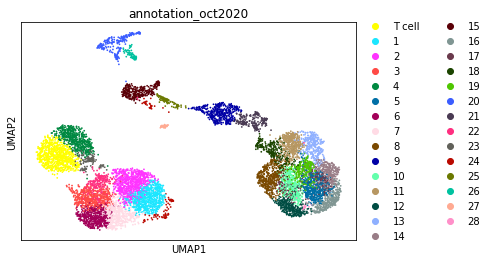

In [35]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# create celltype subcluster
This is just an example once the celltype annotations are done, how to subcluster cells in a celltype

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



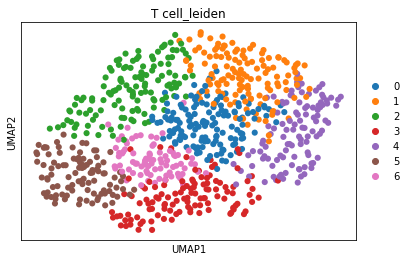

In [36]:
celltype = "T cell"
sub_organ_adata = organ_adata[organ_adata.obs["annotation_oct2020"] == celltype]
sc.pp.neighbors(sub_organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(
    sub_organ_adata,
)
sc.tl.leiden(sub_organ_adata, resolution=1, key_added="%s_leiden" % celltype)
sc.pl.umap(
    sub_organ_adata,
    color=["%s_leiden" % celltype],
    ncols=3,
)

In [37]:
sc.tl.rank_genes_groups(
    sub_organ_adata, groupby="%s_leiden" % celltype, method="wilcoxon"
)
sub_DE = FormatDE(sub_organ_adata.uns["rank_genes_groups"])

0


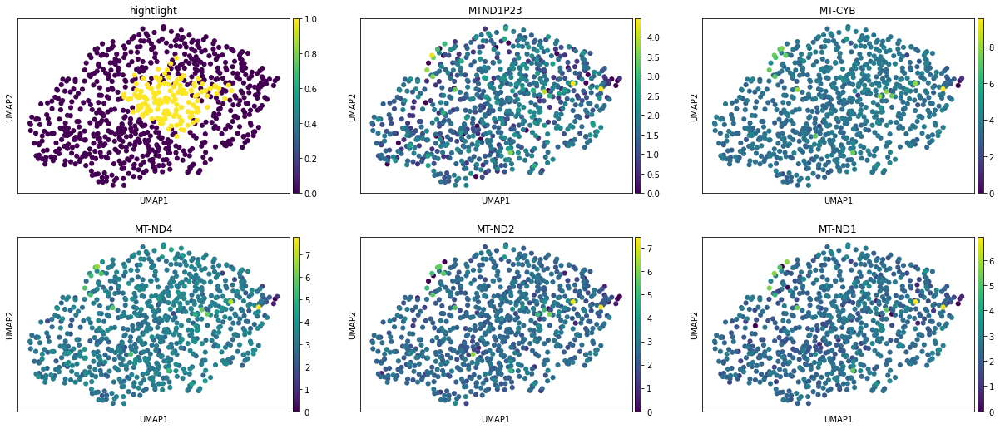

1


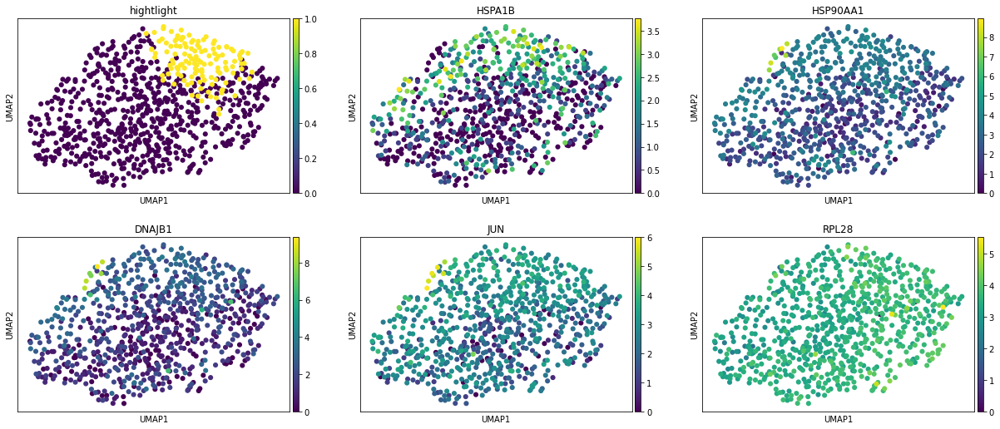

2


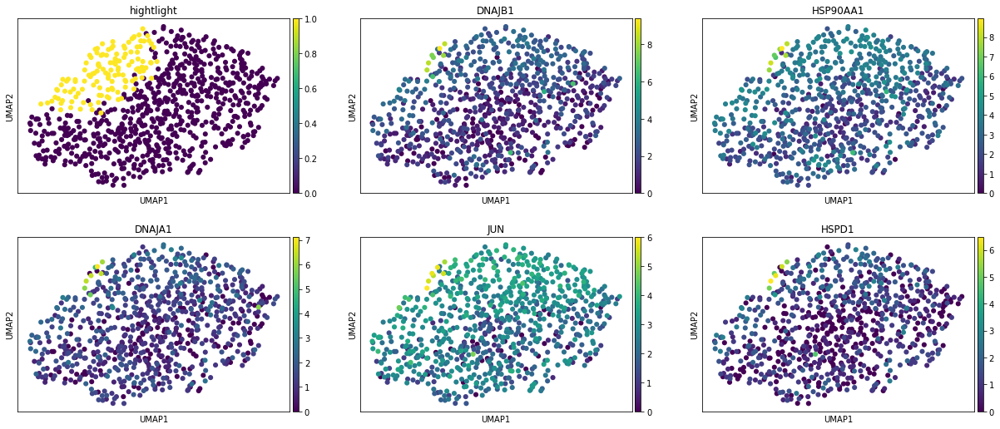

3


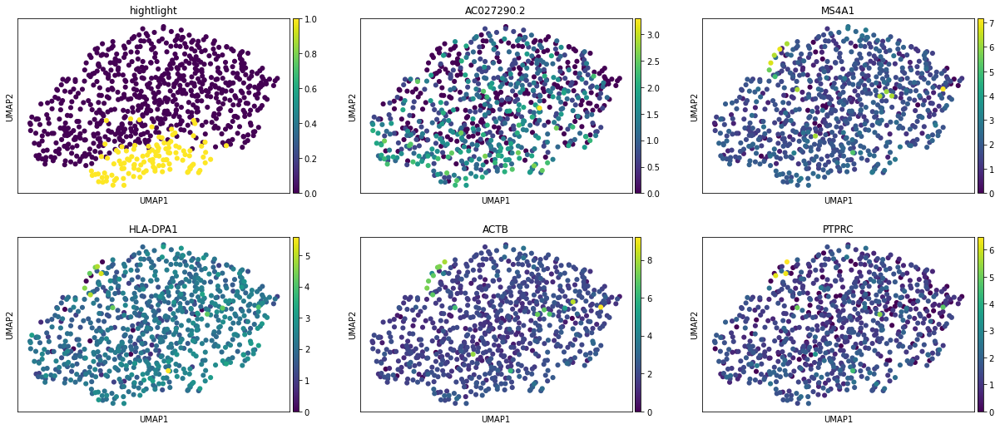

4


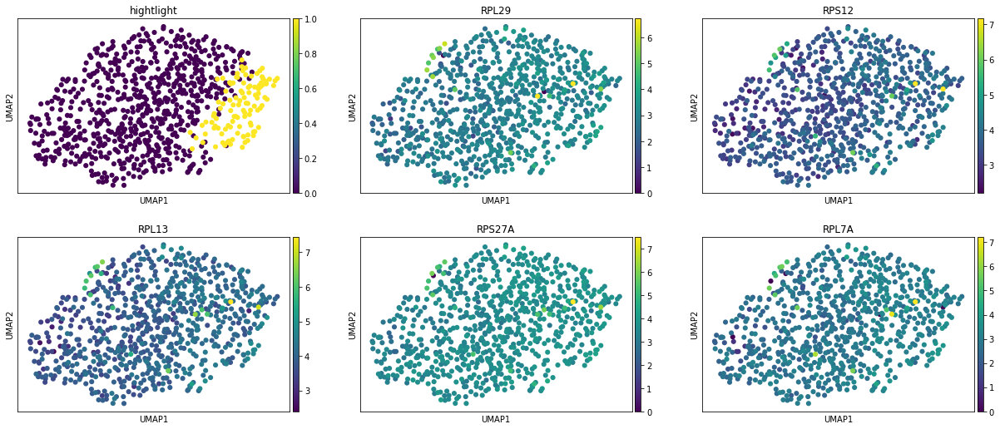

5


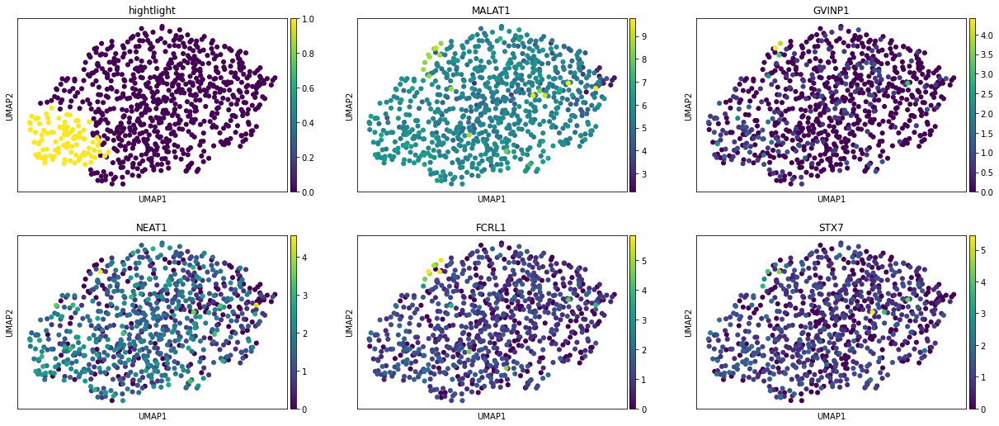

6


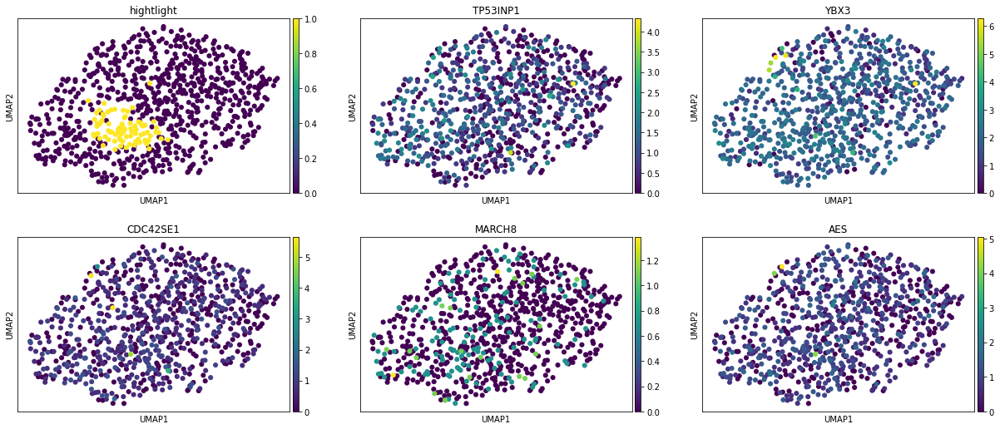

In [38]:
for x in sub_DE.keys():
    print(x)
    topgenes = list(sub_DE[x].T[:5].index)
    sub_organ_adata.obs["hightlight"] = sub_organ_adata.obs["%s_leiden" % celltype] == x
    sc.pl.umap(
        sub_organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

# manually create mapping between cell type and compartment (this is just an example)

In [39]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [40]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

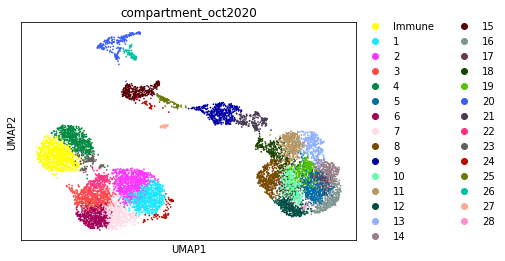

In [41]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [42]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)